In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict, cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import make_scorer
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_auc_score, roc_curve, auc

from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LogisticRegression, LinearRegression
# from catboost import CatBoostClassifier





## Preprocessing

### import

In [30]:
df_bp = pd.read_excel('Datasets/X_bp.xlsx', index_col=0)
df_bp.sample(4)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
234,3.353747,1854.265837,340.827747,98.703490,23.073977,286.331561,449.013284,74.554006,2951.501413,247.521239
512,2.798557,1856.907169,1371.328452,101.205693,18.295866,301.672937,601.823217,73.934960,3221.945991,181.278529
334,3.561485,1977.213130,406.477011,84.946013,23.076235,246.969923,510.817115,69.783808,3142.987138,203.497741
638,4.237960,1936.877106,1372.830744,115.390951,24.350604,293.844799,341.071010,77.762205,2854.913992,239.208597


In [31]:
df_bp.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1023 entries, 0 to 1022
Data columns (total 10 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
dtypes: float64(10)
memory usage: 87.9 KB


In [32]:
df_nup = pd.read_excel('Datasets/X_nup.xlsx', index_col=0)
df_nup.sample(4)

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
762,90,3.455991,62.789174
437,0,7.068822,83.957249
846,90,12.124311,49.725199
612,90,6.374020,56.332103


In [33]:
df_nup.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1040 entries, 0 to 1039
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Угол нашивки, град  1040 non-null   int64  
 1   Шаг нашивки         1040 non-null   float64
 2   Плотность нашивки   1040 non-null   float64
dtypes: float64(2), int64(1)
memory usage: 32.5 KB


In [34]:
df = df_bp.merge(df_nup, left_index=True, right_index=True, how='inner')
df.reset_index(drop=True, inplace=True) 
df

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90,6.313201,58.261074


Проверка датасета на нулевые, пустые значения, анализ типа данных

In [35]:
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [37]:
df.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [38]:
df.isnull().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [39]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


In [40]:
df.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [41]:
df['Угол нашивки, град'].value_counts()

Угол нашивки, град
0     520
90    503
Name: count, dtype: int64

In [42]:
labelencoder = LabelEncoder()
df['Угол нашивки, град'] = labelencoder.fit_transform(df['Угол нашивки, град'])
df['Угол нашивки, град'].value_counts()


Угол нашивки, град
0    520
1    503
Name: count, dtype: int64

In [43]:
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [44]:
# Распределение по параметру 'Угол нашивки, град' не требует дополнительной визуализации, уберем для более аккуратной визуализации
visual_col = ['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       # 'Угол нашивки, град', 
       'Шаг нашивки', 'Плотность нашивки']

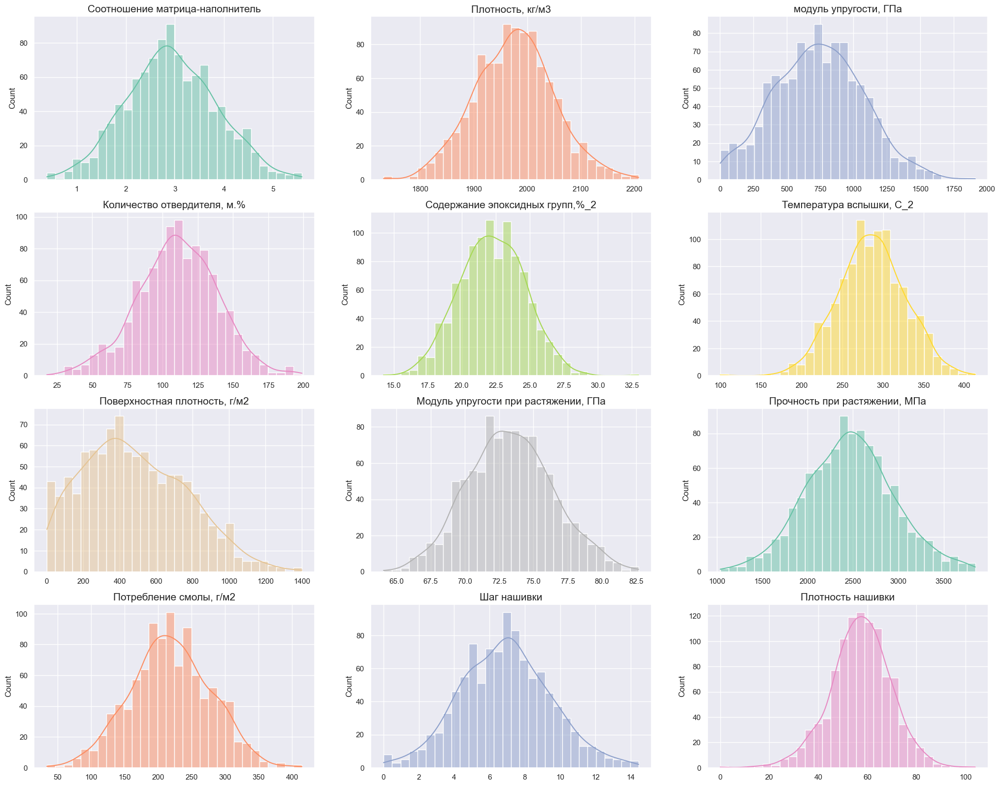

In [45]:
sns.set(style="darkgrid")

colors = sns.color_palette("Set2", 13)
plt.figure(figsize=(25,25))

for i, column in enumerate(visual_col):
    n = i + 1
    plt.subplot(5, 3, n)
    sns.histplot(data=df, x=column, kde=True, bins=30, color=colors[i]).set(xlabel=None)
    plt.title(column, size = 15)


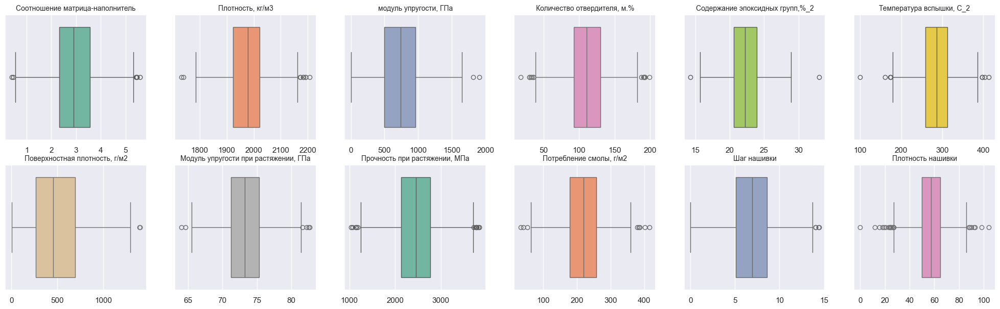

In [47]:
plt.figure(figsize=(25,7))

for i, column in enumerate(visual_col):
    n = i + 1
    plt.subplot(2, 6, n)
    sns.boxplot(data=df, x=column, color=colors[i]).set(xlabel=None)
    plt.title(column, size = 10)

Text(0.5, 1.0, 'Коррелляция признаков композитных материалов')

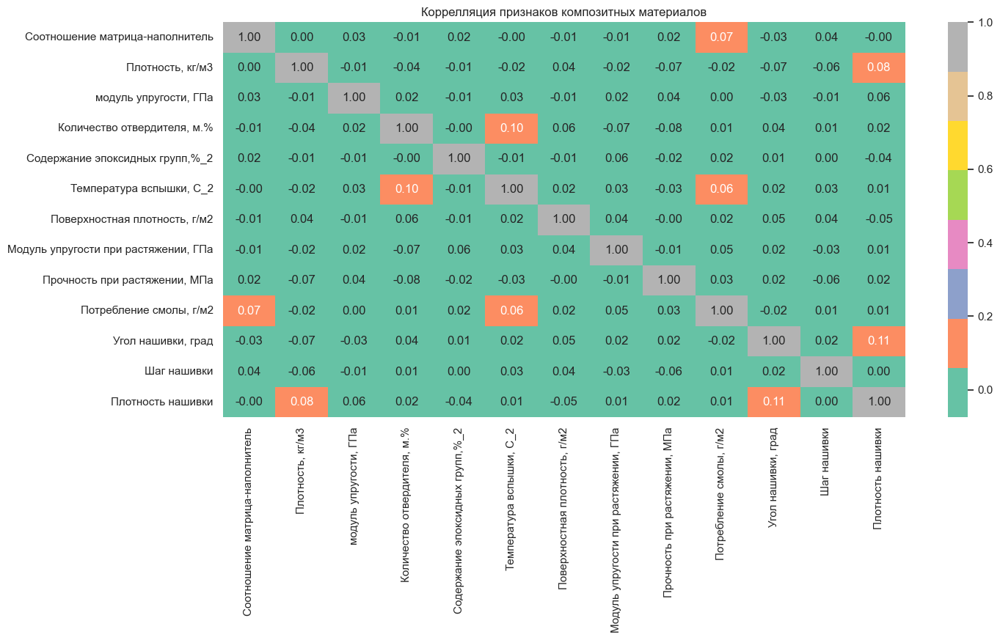

In [48]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(), cmap='Set2', annot=True, fmt='.2f').set_title('Коррелляция признаков композитных материалов')

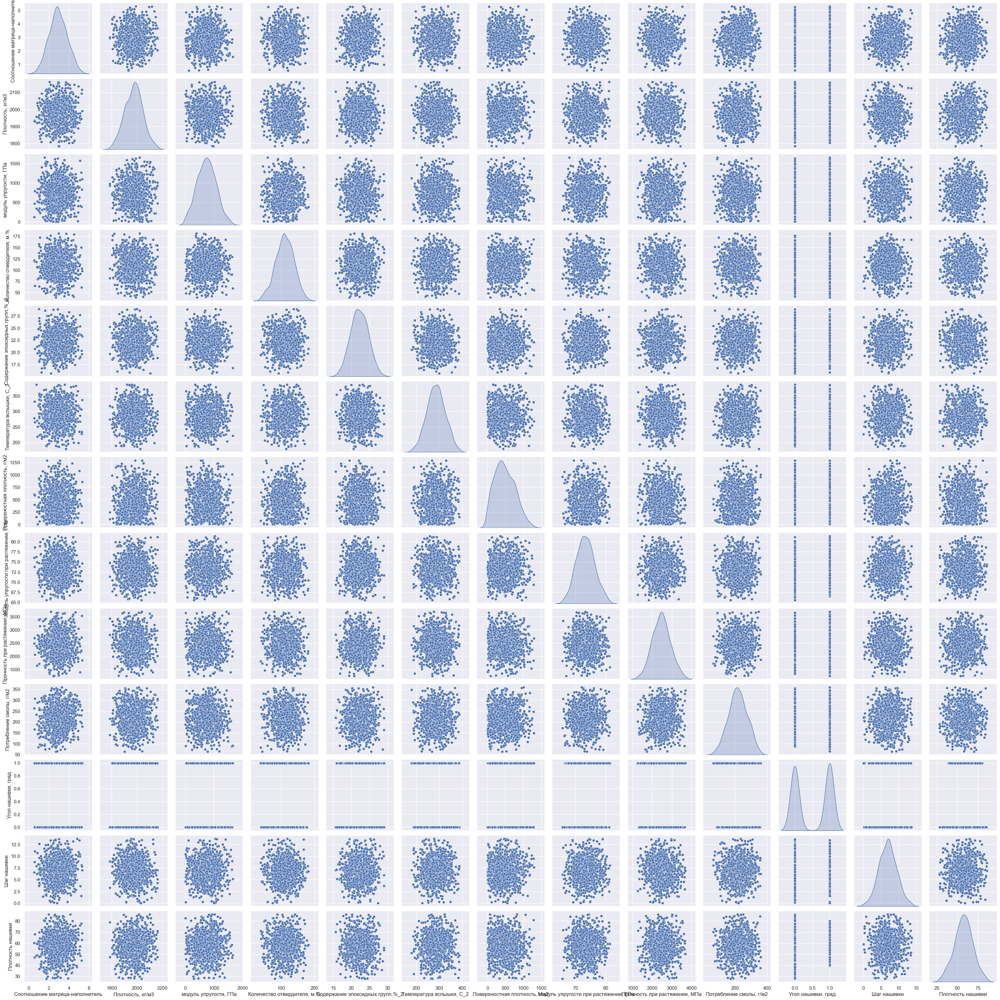

In [134]:
sns.pairplot(df, diag_kind='kde')

In [50]:
df_reserve = df.copy()

In [52]:
for col in df:
    q25, q75 = df[col].quantile(0.25), df[col].quantile(0.75)
    iqr = q75 - q25 # межквартильный размах
    
    upper_bound = q75 + (1.5 * iqr) # 
    lower_bound = q25 - (1.5 * iqr)
    
    df[df[col] <= lower_bound] = np.nan
    df[df[col] >= upper_bound] = np.nan

df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [53]:
df = df.dropna(axis = 0)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
5,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,60.0
6,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,70.0


In [136]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 932 entries, 1 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       932 non-null    float64
 1   Плотность, кг/м3                      932 non-null    float64
 2   модуль упругости, ГПа                 932 non-null    float64
 3   Количество отвердителя, м.%           932 non-null    float64
 4   Содержание эпоксидных групп,%_2       932 non-null    float64
 5   Температура вспышки, С_2              932 non-null    float64
 6   Поверхностная плотность, г/м2         932 non-null    float64
 7   Модуль упругости при растяжении, ГПа  932 non-null    float64
 8   Прочность при растяжении, МПа         932 non-null    float64
 9   Потребление смолы, г/м2               932 non-null    float64
 10  Угол нашивки, град                    932 non-null    float64
 11  Шаг нашивки            

In [138]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,932.0,2.926540,0.895372,0.547391,2.319283,2.906270,3.548025,5.314144
"Плотность, кг/м3",932.0,1974.135262,70.943493,1784.482245,1923.143143,1977.450684,2020.339717,2161.565216
"модуль упругости, ГПа",932.0,738.306618,329.197117,2.436909,498.577158,738.736842,961.650808,1649.415706
"Количество отвердителя, м.%",932.0,110.965202,26.971027,38.668500,92.523816,111.113175,130.001450,181.828448
"Содержание эпоксидных групп,%_2",932.0,22.203661,2.398124,15.695894,20.558296,22.178471,23.961351,28.955094
"Температура вспышки, С_2",932.0,285.950164,39.404771,179.374391,259.103839,285.951496,312.837916,386.067992
"Поверхностная плотность, г/м2",932.0,482.864182,279.656307,0.603740,266.978731,457.732246,694.903763,1291.340115
"Модуль упругости при растяжении, ГПа",932.0,73.301871,3.042231,65.553336,71.233343,73.259230,75.310788,81.417126
"Прочность при растяжении, МПа",932.0,2464.096062,459.217110,1250.392802,2146.936034,2456.394188,2752.348908,3689.223681
"Потребление смолы, г/м2",932.0,217.696459,57.789299,63.685698,179.489091,218.250769,256.749159,359.052220


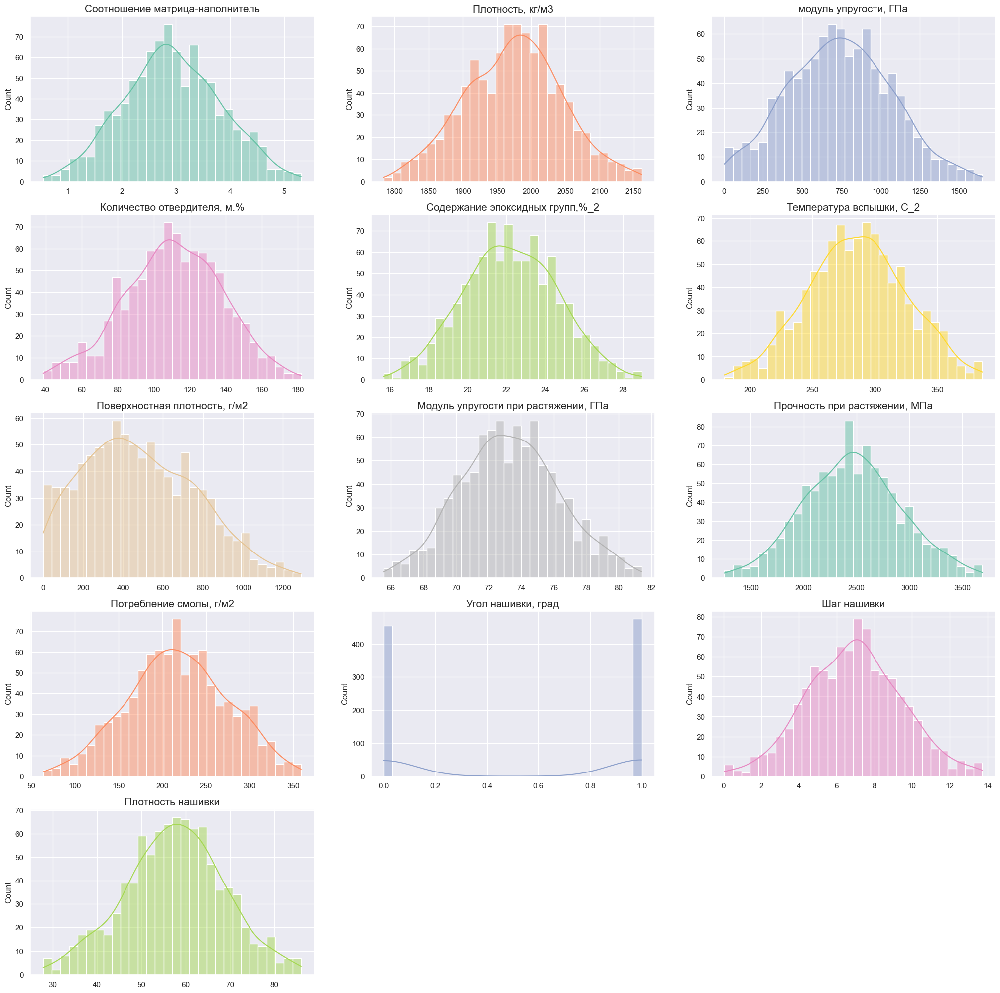

In [55]:
plt.figure(figsize=(25,25))

for i, column in enumerate(df.columns):
    n = i + 1
    plt.subplot(5, 3, n)
    sns.histplot(data=df, x=column, kde=True, bins=30, color=colors[i]).set(xlabel=None)
    plt.title(column, size = 15)

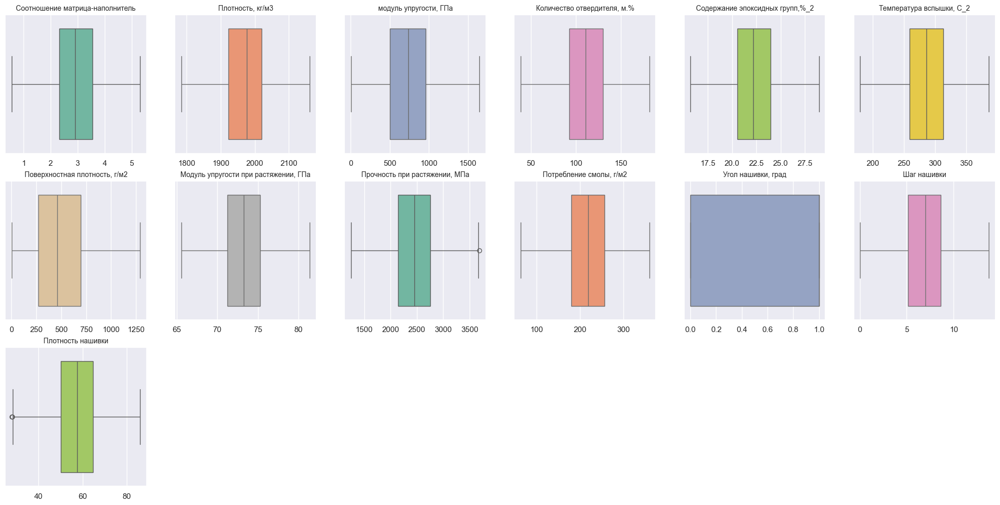

In [135]:
plt.figure(figsize=(25,12))

for i, column in enumerate(df.columns):
    n = i + 1
    plt.subplot(3, 6, n)
    sns.boxplot(data=df, x=column, color=colors[i]).set(xlabel=None)
    plt.title(column, size = 10)

Text(0.5, 1.0, 'Коррелляция признаков композитных материалов')

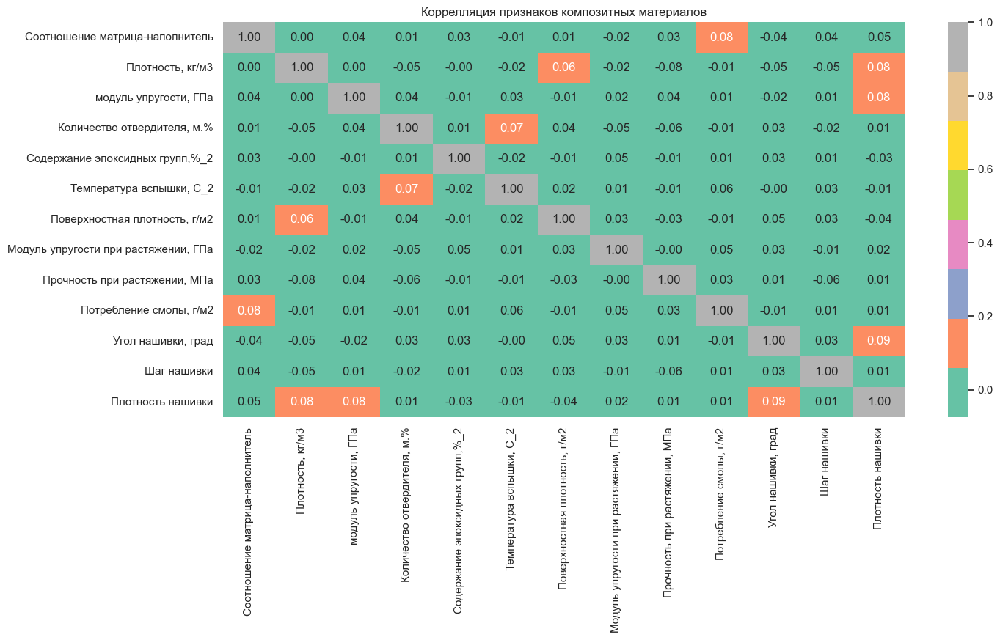

In [57]:
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(), cmap='Set2', annot=True, fmt='.2f').set_title('Коррелляция признаков композитных материалов')

In [58]:
df.columns

Index(['Соотношение матрица-наполнитель', 'Плотность, кг/м3',
       'модуль упругости, ГПа', 'Количество отвердителя, м.%',
       'Содержание эпоксидных групп,%_2', 'Температура вспышки, С_2',
       'Поверхностная плотность, г/м2', 'Модуль упругости при растяжении, ГПа',
       'Прочность при растяжении, МПа', 'Потребление смолы, г/м2',
       'Угол нашивки, град', 'Шаг нашивки', 'Плотность нашивки'],
      dtype='object')

In [59]:
# df.corrwith(df['Модуль упругости при растяжении, ГПа']).abs().sort_values(ascending=False)

In [60]:
# df.corrwith(df['Прочность при растяжении, МПа']).abs().sort_values(ascending=False)

In [61]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,932.0,2.926540,0.895372,0.547391,2.319283,2.906270,3.548025,5.314144
"Плотность, кг/м3",932.0,1974.135262,70.943493,1784.482245,1923.143143,1977.450684,2020.339717,2161.565216
"модуль упругости, ГПа",932.0,738.306618,329.197117,2.436909,498.577158,738.736842,961.650808,1649.415706
"Количество отвердителя, м.%",932.0,110.965202,26.971027,38.668500,92.523816,111.113175,130.001450,181.828448
"Содержание эпоксидных групп,%_2",932.0,22.203661,2.398124,15.695894,20.558296,22.178471,23.961351,28.955094
"Температура вспышки, С_2",932.0,285.950164,39.404771,179.374391,259.103839,285.951496,312.837916,386.067992
"Поверхностная плотность, г/м2",932.0,482.864182,279.656307,0.603740,266.978731,457.732246,694.903763,1291.340115
"Модуль упругости при растяжении, ГПа",932.0,73.301871,3.042231,65.553336,71.233343,73.259230,75.310788,81.417126
"Прочность при растяжении, МПа",932.0,2464.096062,459.217110,1250.392802,2146.936034,2456.394188,2752.348908,3689.223681
"Потребление смолы, г/м2",932.0,217.696459,57.789299,63.685698,179.489091,218.250769,256.749159,359.052220


#### Распределение данных на графике и корреляция

In [62]:
# def corr_with(df, y, corr=0.1):
#     df_corr = abs(df.corrwith(df[y]))
#     df_corr = pd.DataFrame(df_corr.values, df.columns).reset_index()
#     df_corr.columns = ['Feature', 'Corr']
#     df_corr = df_corr[df_corr['Corr'] > corr]
#     df_corr = df_corr.sort_values(by='Corr', ascending=False)
#     df_corr = df_corr.head(20)
#     return df_corr

In [63]:
# corr_with(df, y='Прочность при растяжении, МПа', corr=0.05) #'Модуль упругости при растяжении, ГПа'

In [64]:
# corr_features = corr_with(df, y='Прочность при растяжении, МПа', corr=0.05)['Feature'].to_list()
# corr_features

In [65]:
# sns.pairplot(df[corr_features], hue='Прочность при растяжении, МПа', aspect=1.5)
# plt.show()

In [66]:
# sns.scatterplot(data=df, x='Плотность, кг/м3', y='Количество отвердителя, м.%', size='Прочность при растяжении, МПа', hue='Прочность при растяжении, МПа', alpha=0.25, palette='magma')

#### Разбиваем выборку на обучающую и тестовую перед дальнейшей обработкой данных воизбежания перетекания информации из обучающей в тестовую выборки

In [67]:
y_uprug = df['Модуль упругости при растяжении, ГПа'].copy()
X_uprug = df.drop('Модуль упругости при растяжении, ГПа', axis=1)

y_proch = df['Прочность при растяжении, МПа'].copy()
X_proch = df.drop('Прочность при растяжении, МПа', axis=1)


In [68]:
X_train_upr, X_test_upr, y_train_upr, y_test_upr = train_test_split(X_uprug, y_uprug, test_size=0.3, random_state=1989)
X_train_pr, X_test_pr, y_train_pr, y_test_pr = train_test_split(X_proch, y_proch, test_size=0.3, random_state=1989) 

In [139]:
X_train_upr.shape, X_test_upr.shape, y_train_upr.shape, y_test_upr.shape

((652, 12), (280, 12), (652,), (280,))

In [69]:
y_test_upr.shape, y_test_pr.shape

((280,), (280,))

Нормирование и стандартизация данных

In [70]:
def scale(df, scaler='std'):
    scaler_list = ['std', 'mm']
    if scaler not in scaler_list:
        print('Use scaler "std" for StandardScaler or "mm" for MinMaxScaler')
    else:
        if scaler == 'std':
            scaler = StandardScaler()
        else:
            scaler = MinMaxScaler()
        dataset = scaler.fit_transform(np.array(df))
        df_scaled = pd.DataFrame(data = dataset, columns = df.columns)
    return df_scaled


In [71]:
X_train_upr_norm, X_test_upr_norm = scale(X_train_upr, scaler='mm'), scale(X_test_upr, scaler='mm')
X_train_upr_norm.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.232787,0.464393,0.089503,0.555436,0.274165,0.334720,0.764368,0.450084,0.366070,0.0,0.117678,0.678848
1,0.216822,0.585729,0.648799,0.758078,0.485001,0.434024,0.075939,0.722342,0.218955,1.0,0.526541,0.418952
2,0.201813,0.555978,0.556937,0.101972,0.444434,0.913332,0.220757,0.447824,0.546718,0.0,0.438104,0.908963
3,0.493801,0.623520,0.168611,0.400788,0.303143,0.587846,0.791026,0.140143,0.601397,0.0,0.476435,0.027196
4,0.457164,0.772819,0.547866,0.671847,0.336962,0.588407,0.210009,0.717149,0.986139,0.0,0.667385,0.970898


In [72]:
# X_train_upr_std, X_test_upr_std = scale(X_train_upr, scaler='std'), scale(X_test_upr, scaler='std')
# X_train_upr_std.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,-1.390844,-0.212219,-1.809261,0.256680,-1.165942,-0.810869,1.813888,-0.263274,-0.826725,-1.037513,-2.076378,0.896966
1,-1.474952,0.418757,0.969385,1.331185,-0.030127,-0.312167,-1.366078,1.166371,-1.578244,0.963843,0.144307,-0.478111
2,-1.554020,0.264044,0.513004,-2.147801,-0.248669,2.094902,-0.697136,-0.275144,0.096094,-1.037513,-0.336027,2.114476
3,-0.015737,0.615277,-1.416244,-0.563336,-1.009835,0.460322,1.937026,-1.890798,0.375416,-1.037513,-0.127836,-2.550851
4,-0.208752,1.391658,0.467937,0.873949,-0.827646,0.463140,-0.746785,1.139106,2.340817,-1.037513,0.909285,2.442168


In [73]:
# pca = PCA()
# X_pca = pca.fit_transform(X_train_upr_norm)

# component_names = [f"PC{i + 1}" for i in range(X_pca.shape[1])]
# X_pca = pd.DataFrame(X_pca, columns=component_names)

# loadings = pd.DataFrame(
#     pca.components_.T,
#     columns=component_names,
#     index=X_train_upr_norm.columns,
# )

# print(loadings)

# #критерий информативности,
# pca.explained_variance_ratio_

In [74]:
# pca2 = PCA()
# X_pca_std = pca2.fit_transform(X_train_upr_std)

# component_names = [f"PC{i + 1}" for i in range(X_train_upr_std.shape[1])]
# X_pca_std = pd.DataFrame(X_pca_std, columns=component_names)

# loadings = pd.DataFrame(
#     pca2.components_.T,
#     columns=component_names,
#     index=X_train_upr_std.columns,
# )

# print(loadings)

# #критерий информативности,
# pca2.explained_variance_ratio_

In [75]:
# #неприменимы для обучения с учителем
# X_train_std = X_train_std.join(X_pca[['PC1', 'PC2']])
# X_train_std.describe()

In [76]:
# X_train_std.drop(['PC1', 'PC2'], axis=1, inplace=True)
# X_train_std

In [77]:
X_train_pr_norm, X_test_pr_norm = scale(X_train_pr, scaler='mm'), scale(X_test_pr, scaler='mm')
X_train_pr_norm.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.232787,0.464393,0.089503,0.555436,0.274165,0.334720,0.764368,0.836847,0.366070,0.0,0.117678,0.678848
1,0.216822,0.585729,0.648799,0.758078,0.485001,0.434024,0.075939,0.496463,0.218955,1.0,0.526541,0.418952
2,0.201813,0.555978,0.556937,0.101972,0.444434,0.913332,0.220757,0.361687,0.546718,0.0,0.438104,0.908963
3,0.493801,0.623520,0.168611,0.400788,0.303143,0.587846,0.791026,0.779780,0.601397,0.0,0.476435,0.027196
4,0.457164,0.772819,0.547866,0.671847,0.336962,0.588407,0.210009,0.437139,0.986139,0.0,0.667385,0.970898


In [78]:
# X_train_pr_std, X_test_pr_std = scale(X_train_pr, scaler='std'), scale(X_test_pr, scaler='std')
# X_train_pr_std.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,-1.390844,-0.212219,-1.809261,0.256680,-1.165942,-0.810869,1.813888,1.770454,-0.826725,-1.037513,-2.076378,0.896966
1,-1.474952,0.418757,0.969385,1.331185,-0.030127,-0.312167,-1.366078,0.053591,-1.578244,0.963843,0.144307,-0.478111
2,-1.554020,0.264044,0.513004,-2.147801,-0.248669,2.094902,-0.697136,-0.626208,0.096094,-1.037513,-0.336027,2.114476
3,-0.015737,0.615277,-1.416244,-0.563336,-1.009835,0.460322,1.937026,1.482613,0.375416,-1.037513,-0.127836,-2.550851
4,-0.208752,1.391658,0.467937,0.873949,-0.827646,0.463140,-0.746785,-0.245637,2.340817,-1.037513,0.909285,2.442168


In [152]:
X_train_upr_norm.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,652.0,0.496789,0.189960,0.0,0.371041,0.493133,0.626960,1.0
"Плотность, кг/м3",652.0,0.505202,0.192448,0.0,0.369291,0.511229,0.625078,1.0
"модуль упругости, ГПа",652.0,0.453678,0.201438,0.0,0.303720,0.454347,0.587514,1.0
"Количество отвердителя, м.%",652.0,0.507028,0.188736,0.0,0.376190,0.502823,0.639116,1.0
"Содержание эпоксидных групп,%_2",652.0,0.490594,0.185768,0.0,0.361671,0.488852,0.625197,1.0
"Температура вспышки, С_2",652.0,0.496184,0.199278,0.0,0.361825,0.498312,0.632621,1.0
"Поверхностная плотность, г/м2",652.0,0.371680,0.216656,0.0,0.208074,0.349400,0.537910,1.0
"Прочность при растяжении, МПа",652.0,0.500221,0.190584,0.0,0.371669,0.498139,0.625920,1.0
"Потребление смолы, г/м2",652.0,0.527907,0.195907,0.0,0.395795,0.527456,0.663953,1.0
"Угол нашивки, град",652.0,0.518405,0.500045,0.0,0.000000,1.000000,1.000000,1.0


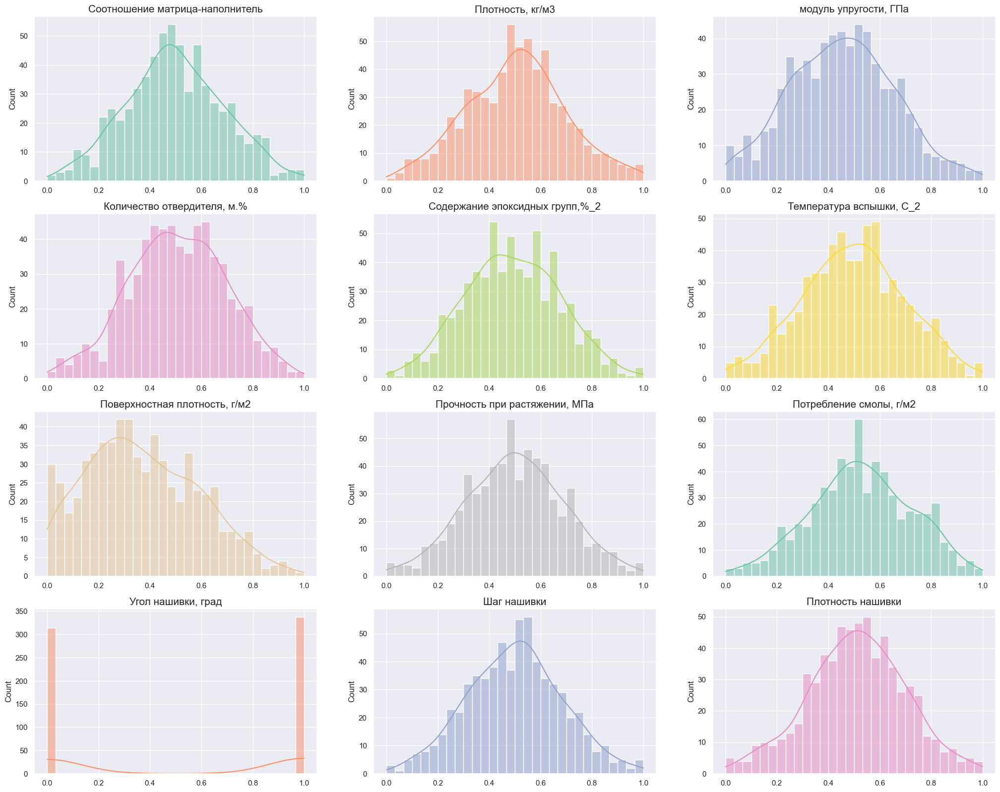

In [ ]:
plt.figure(figsize=(25,25))

for i, column in enumerate(X_train_upr_norm.columns):
    n = i + 1
    plt.subplot(5, 3, n)
    sns.histplot(data=X_train_upr_norm, x=column, kde=True, bins=30, color=colors[i]).set(xlabel=None)
    plt.title(column, size = 15)

<Axes: >

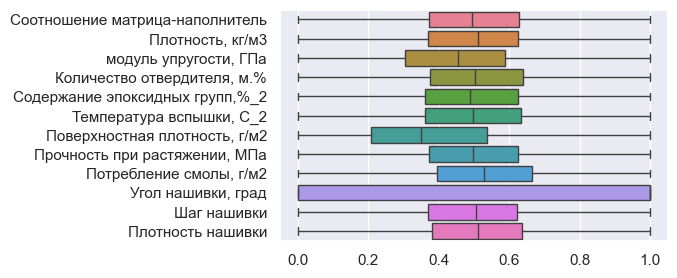

In [154]:
plt.figure(figsize=(5,3))
sns.boxplot(data=X_train_upr_norm, orient='y') 

In [151]:
X_train_pr_norm.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,652.0,0.496789,0.189960,0.0,0.371041,0.493133,0.626960,1.0
"Плотность, кг/м3",652.0,0.505202,0.192448,0.0,0.369291,0.511229,0.625078,1.0
"модуль упругости, ГПа",652.0,0.453678,0.201438,0.0,0.303720,0.454347,0.587514,1.0
"Количество отвердителя, м.%",652.0,0.507028,0.188736,0.0,0.376190,0.502823,0.639116,1.0
"Содержание эпоксидных групп,%_2",652.0,0.490594,0.185768,0.0,0.361671,0.488852,0.625197,1.0
"Температура вспышки, С_2",652.0,0.496184,0.199278,0.0,0.361825,0.498312,0.632621,1.0
"Поверхностная плотность, г/м2",652.0,0.371680,0.216656,0.0,0.208074,0.349400,0.537910,1.0
"Модуль упругости при растяжении, ГПа",652.0,0.485838,0.198411,0.0,0.352545,0.482713,0.610867,1.0
"Потребление смолы, г/м2",652.0,0.527907,0.195907,0.0,0.395795,0.527456,0.663953,1.0
"Угол нашивки, град",652.0,0.518405,0.500045,0.0,0.000000,1.000000,1.000000,1.0


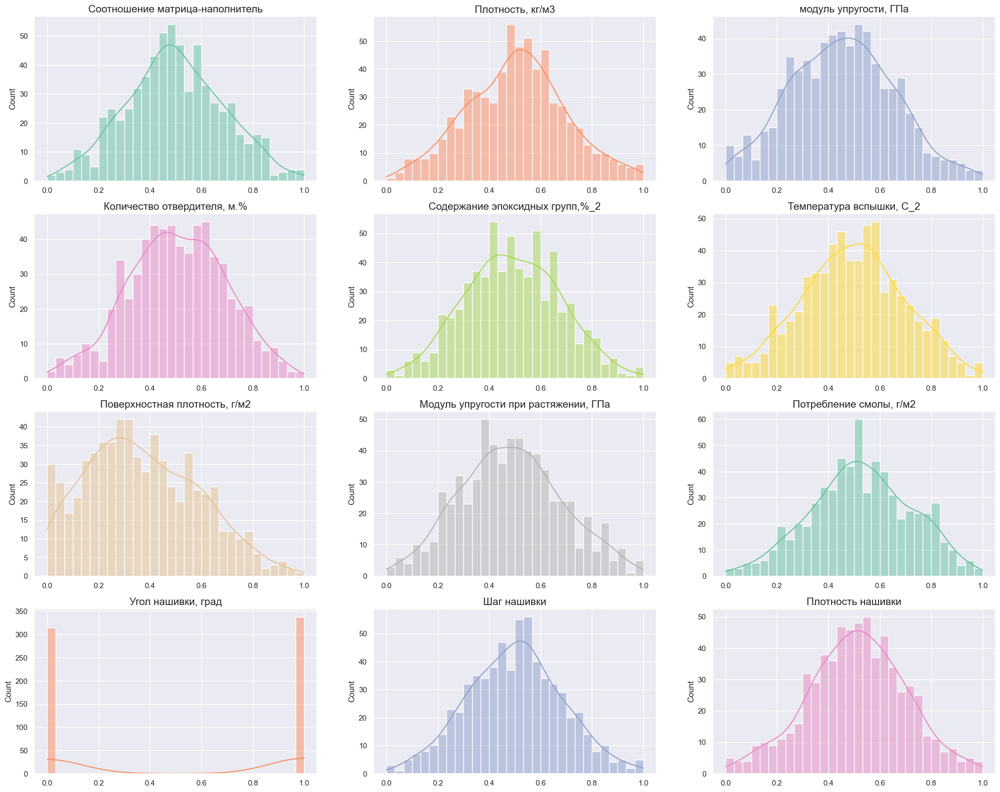

In [79]:
plt.figure(figsize=(25,25))

for i, column in enumerate(X_train_pr_norm.columns):
    n = i + 1
    plt.subplot(5, 3, n)
    sns.histplot(data=X_train_pr_norm, x=column, kde=True, bins=30, color=colors[i]).set(xlabel=None)
    plt.title(column, size = 15)

<Axes: >

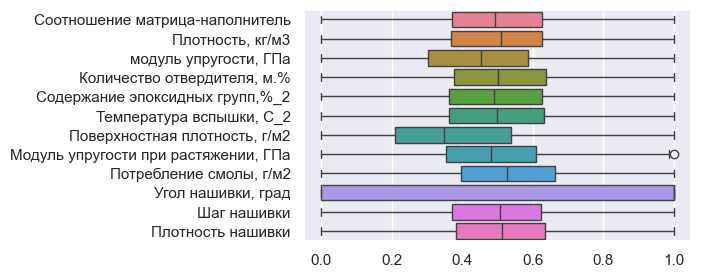

In [150]:
plt.figure(figsize=(5,3))
sns.boxplot(data=X_train_pr_norm, orient='y') 

Выбор классификатора

In [85]:
def hyperparam(X_train, y_train, models, params):
    best_params = {}
    for model_name, model in models.items():
        # if params[model_name]:
        model = GridSearchCV(model, params[model_name], cv=10, n_jobs=-1, verbose=0, scoring = 'neg_mean_absolute_error')
        model = model.fit(X_train, y_train)
        best_params[model_name] = model.best_params_
        print(f"Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели {model_name}:  {model.best_params_}")
        # else:
        #     model = model.fit(X_train, y_train)
        #     print("Гиперпараметры не заданы")
    return  best_params #models,

In [86]:
def modeling(X_train, y_train, X_test, y_test, models):
    mse = {}
    rmse = {}
    mae = {}
    r2 = {}
    r2_train = {}

    y_pred = {}

    for model_name, model in models.items():
        
        model.fit(X_train, y_train)
        y_pred[model_name] = model.predict(X_test)
        # Вычисляем метрики
        mse[model_name] = mean_squared_error(y_test, y_pred[model_name])
        rmse[model_name] = np.sqrt(mse[model_name])
        mae[model_name] = mean_absolute_error(y_test, y_pred[model_name])
        r2_train[model_name] = model.score(X_train, y_train)
        # score_test[model_name] = model.score(X_test, y_test)

        r2[model_name] = r2_score(y_test, y_pred[model_name])

    metrics = pd.DataFrame({
        "R2_train": pd.Series(r2_train),
        "R2": pd.Series(r2),
        "MSE": pd.Series(mse),
        "RMSE": pd.Series(rmse),
        "MAE": pd.Series(mae),
        

    })
    return models, metrics, y_pred


In [87]:
models = {
    "lin_reg": LinearRegression(),
    "random_forest_reg": RandomForestRegressor(), 
    "knn_reg": KNeighborsRegressor(),
    "svm_reg": SVR(),
    "gb_reg": GradientBoostingRegressor(),
}

In [90]:
models_params = {"lin_reg": {'fit_intercept': [True, False]},
                "random_forest_reg": {'criterion': ['squared_error', 'absolute_error', 'friedman_mse', 'poisson'],
                                    'n_estimators': range (1, 51, 10),
                                    'max_depth': range (1, 12, 2),
                                    'min_samples_leaf': range (1, 5),
                                    'min_samples_split': range (2, 10, 2)},
                "knn_reg": {'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                            'n_neighbors': range(1, 101, 10)},
                "svm_reg": {'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
                            'C': [0.0001, 0.005, 0.01, 0.1, 0.5]},
                "gb_reg": {'loss': ['squared_error', 'absolute_error', 'huber', 'quantile'], 
                            'n_estimators': range (1, 51, 10),
                            'max_depth': range (1, 10),
                            'max_features': ['sqrt', 'log2']} #'auto'
                }

In [91]:
upr_std_best_params = hyperparam(X_train_upr_std, y_train_upr, models, models_params) #models_upr_std, 
upr_std_best_params

Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели lin_reg:  {'fit_intercept': True}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели random_forest_reg:  {'criterion': 'absolute_error', 'max_depth': 1, 'min_samples_leaf': 4, 'min_samples_split': 4, 'n_estimators': 11}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели knn_reg:  {'algorithm': 'auto', 'n_neighbors': 71}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели svm_reg:  {'C': 0.0001, 'kernel': 'rbf'}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели gb_reg:  {'loss': 'absolute_error', 'max_depth': 8, 'max_features': 'log2', 'n_estimators': 1}


{'lin_reg': {'fit_intercept': True},
 'random_forest_reg': {'criterion': 'absolute_error',
  'max_depth': 1,
  'min_samples_leaf': 4,
  'min_samples_split': 4,
  'n_estimators': 11},
 'knn_reg': {'algorithm': 'auto', 'n_neighbors': 71},
 'svm_reg': {'C': 0.0001, 'kernel': 'rbf'},
 'gb_reg': {'loss': 'absolute_error',
  'max_depth': 8,
  'max_features': 'log2',
  'n_estimators': 1}}

In [92]:
models_upr_std = {
    "lin_reg": LinearRegression(fit_intercept=True),
    "random_forest_reg": RandomForestRegressor(criterion='poisson', max_depth=1, min_samples_leaf=1, min_samples_split=6, n_estimators=1), 
    "knn_reg": KNeighborsRegressor(algorithm='auto', n_neighbors=50),
    "svm_reg": SVR(C=0.0001, kernel='rbf'),
    "gb_reg": GradientBoostingRegressor(loss='absolute_error', max_depth=5, max_features='sqrt', n_estimators=11),
}

In [93]:
models_upr_std, metrics_upr_std, y_pred_upr_std = modeling(X_train_upr_std, y_train_upr, X_test_upr_std, y_test_upr, models_upr_std)
metrics_upr_std

,R2_train,R2,MSE,RMSE,MAE
lin_reg,0.017960,-0.036578,8.686546,2.947295,2.383837
random_forest_reg,-0.010521,-0.087935,9.116925,3.019425,2.420839
knn_reg,0.019450,0.005771,8.331661,2.886462,2.330726
svm_reg,-0.000056,-0.007107,8.439584,2.905096,2.345165
gb_reg,0.115080,0.004619,8.341320,2.888134,2.327701


In [94]:
upr_norm_best_params = hyperparam(X_train_upr_norm, y_train_upr, models, models_params)
upr_norm_best_params

Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели lin_reg:  {'fit_intercept': True}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели random_forest_reg:  {'criterion': 'absolute_error', 'max_depth': 1, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 1}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели knn_reg:  {'algorithm': 'auto', 'n_neighbors': 91}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели svm_reg:  {'C': 0.0001, 'kernel': 'sigmoid'}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели gb_reg:  {'loss': 'squared_error', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 1}


{'lin_reg': {'fit_intercept': True},
 'random_forest_reg': {'criterion': 'absolute_error',
  'max_depth': 1,
  'min_samples_leaf': 1,
  'min_samples_split': 8,
  'n_estimators': 1},
 'knn_reg': {'algorithm': 'auto', 'n_neighbors': 91},
 'svm_reg': {'C': 0.0001, 'kernel': 'sigmoid'},
 'gb_reg': {'loss': 'squared_error',
  'max_depth': 8,
  'max_features': 'sqrt',
  'n_estimators': 1}}

In [95]:
models_upr_norm = {
    "lin_reg": LinearRegression(fit_intercept=True),
    "random_forest_reg": RandomForestRegressor(criterion='absolute_error', max_depth=1, min_samples_leaf=4, min_samples_split=4, n_estimators=21), 
    "knn_reg": KNeighborsRegressor(algorithm='auto', n_neighbors=50),
    "svm_reg": SVR(C=0.0001, kernel='sigmoid'),
    "gb_reg": GradientBoostingRegressor(loss='huber', max_depth=7, max_features='log2', n_estimators=1),
}

In [96]:
models_upr_norm, metrics_upr_norm, y_pred_upr_norm = modeling(X_train_upr_norm, y_train_upr, X_test_upr_norm, y_test_upr, models_upr_norm)
metrics_upr_norm

,R2_train,R2,MSE,RMSE,MAE
lin_reg,0.017960,-0.035956,8.681339,2.946411,2.384254
random_forest_reg,0.016014,-0.009611,8.460565,2.908705,2.352533
knn_reg,0.019474,-0.003453,8.408963,2.899821,2.349794
svm_reg,-0.000094,-0.007112,8.439624,2.905103,2.345167
gb_reg,0.048369,-0.001796,8.395078,2.897426,2.338113


In [97]:
pr_norm_best_params = hyperparam(X_train_pr_norm, y_train_pr, models, models_params)

Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели lin_reg:  {'fit_intercept': True}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели random_forest_reg:  {'criterion': 'poisson', 'max_depth': 1, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 11}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели knn_reg:  {'algorithm': 'auto', 'n_neighbors': 61}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели svm_reg:  {'C': 0.0001, 'kernel': 'sigmoid'}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели gb_reg:  {'loss': 'huber', 'max_depth': 8, 'max_features': 'sqrt', 'n_estimators': 1}


In [98]:
models_pr_norm = {
    "lin_reg": LinearRegression(fit_intercept=True),
    "random_forest_reg": RandomForestRegressor(criterion='poisson', max_depth=3, min_samples_leaf=1, min_samples_split=4, n_estimators=31), 
    "knn_reg": KNeighborsRegressor(algorithm='auto', n_neighbors=33),
    "svm_reg": SVR(C=0.0001, kernel='sigmoid'),
    "gb_reg": GradientBoostingRegressor(loss='huber', max_depth=5, max_features='log2', n_estimators=1),
}


In [99]:
models_pr_norm, metrics_pr_norm, y_pred_pr_norm = modeling(X_train_pr_norm, y_train_pr, X_test_pr_norm, y_test_pr, models_pr_norm)
metrics_pr_norm

,R2_train,R2,MSE,RMSE,MAE
lin_reg,0.021163,-0.016957,206695.283945,454.637530,360.312871
random_forest_reg,0.125847,-0.018735,207056.708314,455.034843,361.342345
knn_reg,0.029685,-0.022027,207725.721556,455.769373,359.418949
svm_reg,-0.000120,-0.007450,204763.093468,452.507562,358.819382
gb_reg,0.023140,-0.010380,205358.486819,453.164966,359.115833


In [100]:
best_params_pr_std = hyperparam(X_train_pr_std, y_train_pr, models, models_params)
best_params_pr_std

Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели lin_reg:  {'fit_intercept': True}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели random_forest_reg:  {'criterion': 'absolute_error', 'max_depth': 11, 'min_samples_leaf': 4, 'min_samples_split': 6, 'n_estimators': 11}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели knn_reg:  {'algorithm': 'auto', 'n_neighbors': 91}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели svm_reg:  {'C': 0.0001, 'kernel': 'poly'}
Лучшие параметры для предсказания признака 'Модуль упругости при растяжении' для модели gb_reg:  {'loss': 'squared_error', 'max_depth': 7, 'max_features': 'sqrt', 'n_estimators': 1}


{'lin_reg': {'fit_intercept': True},
 'random_forest_reg': {'criterion': 'absolute_error',
  'max_depth': 11,
  'min_samples_leaf': 4,
  'min_samples_split': 6,
  'n_estimators': 11},
 'knn_reg': {'algorithm': 'auto', 'n_neighbors': 91},
 'svm_reg': {'C': 0.0001, 'kernel': 'poly'},
 'gb_reg': {'loss': 'squared_error',
  'max_depth': 7,
  'max_features': 'sqrt',
  'n_estimators': 1}}

In [101]:
models_pr_std = {
    "lin_reg": LinearRegression(fit_intercept=True),
    "random_forest_reg": RandomForestRegressor(criterion='poisson', max_depth=9, min_samples_leaf=3, min_samples_split=4, n_estimators=41), 
    "knn_reg": KNeighborsRegressor(algorithm='auto', n_neighbors=49),
    "svm_reg": SVR(C=0.0001, kernel='poly'),
    "gb_reg": GradientBoostingRegressor(loss='huber', max_depth=8, max_features='sqrt', n_estimators=1),
}

In [102]:
models_pr_std, metrics_pr_std, y_pred_pr_std = modeling(X_train_pr_std, y_train_pr, X_test_pr_std, y_test_pr, models_pr_std)
metrics_pr_std

,R2_train,R2,MSE,RMSE,MAE
lin_reg,0.021163,-0.022103,207741.257698,455.786417,361.660760
random_forest_reg,0.569687,-0.043421,212074.173062,460.515117,368.951624
knn_reg,0.021507,-0.032676,209890.211816,458.137765,364.654943
svm_reg,-0.000119,-0.007450,204763.063143,452.507528,358.819362
gb_reg,0.117276,-0.022651,207852.527859,455.908464,363.382624


In [103]:
def comparison_plot(test, predict, y_name, model_name):    
    plt.figure(figsize=(10,3))
    plt.title(f'Сопоставление прогнозных и тестовых значений: {model_name}')
    plt.plot(test, label='Тестовая выборка')
    plt.plot(predict, label='Прогноз')
    plt.legend() # loc='best')
    plt.ylabel(y_name)
    plt.xlabel('Кол-во наблюдений')
    plt.show()

### Визуализация прогноза vs тестовые значения

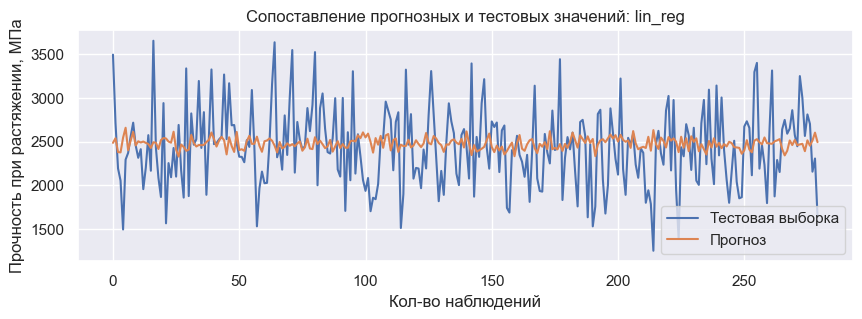

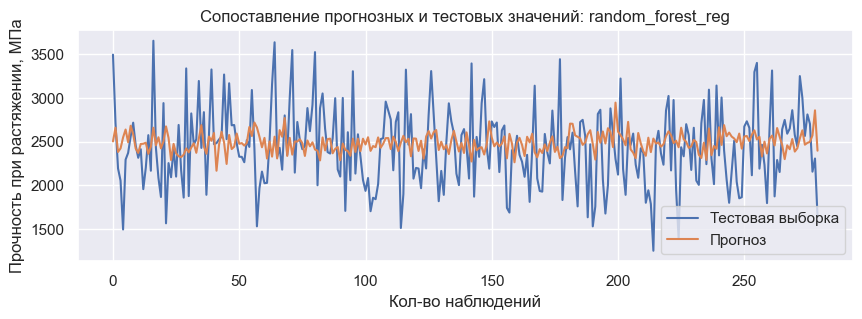

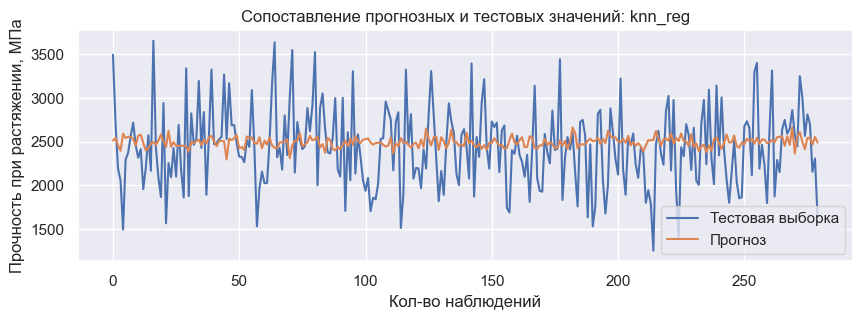

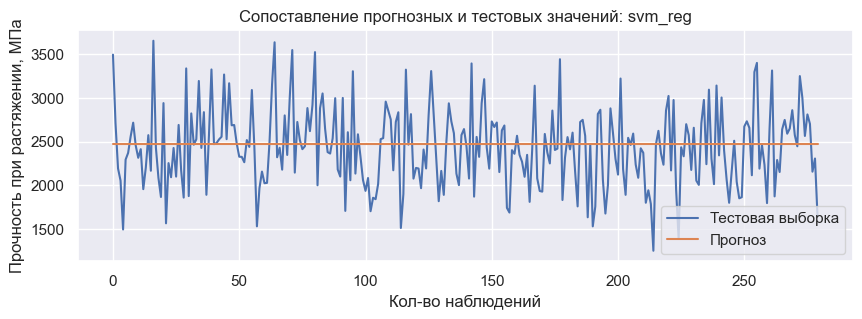

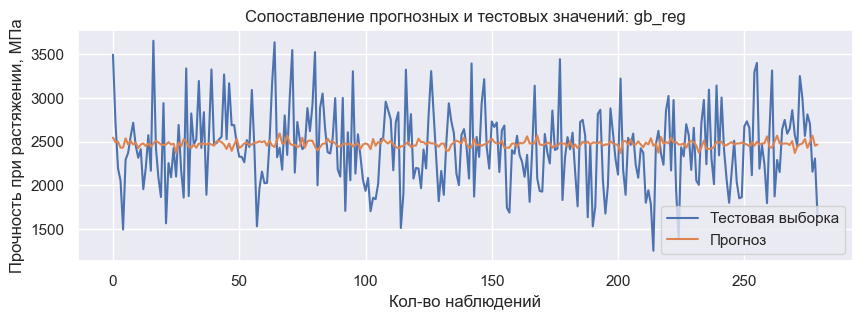

In [104]:
# y_test_list = [y_test_upr, y_test_pr]
# y_test_name = ['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа']
# y_test_dict = {'Модуль упругости при растяжении, ГПа': y_test_upr, 'Прочность при растяжении, МПа': y_test_pr}
y_name = 'Прочность при растяжении, МПа'

for model_name, predict in y_pred_pr_std.items():
    comparison_plot(y_test_pr.values, predict, y_name, model_name)

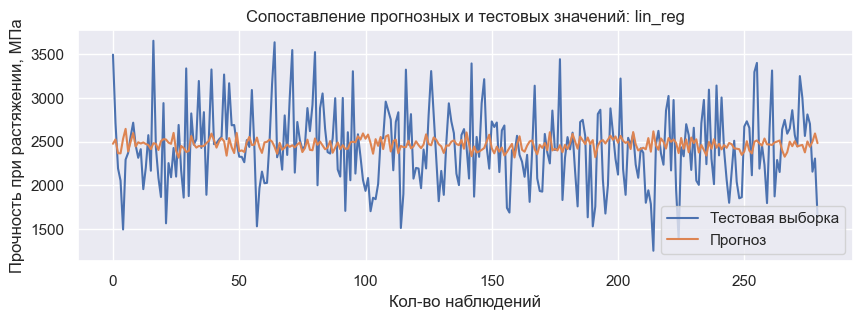

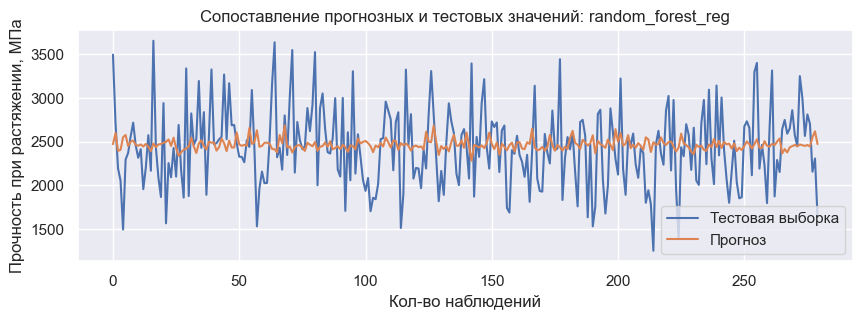

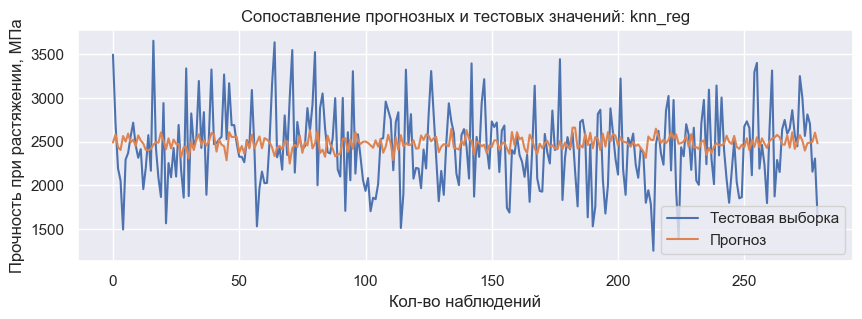

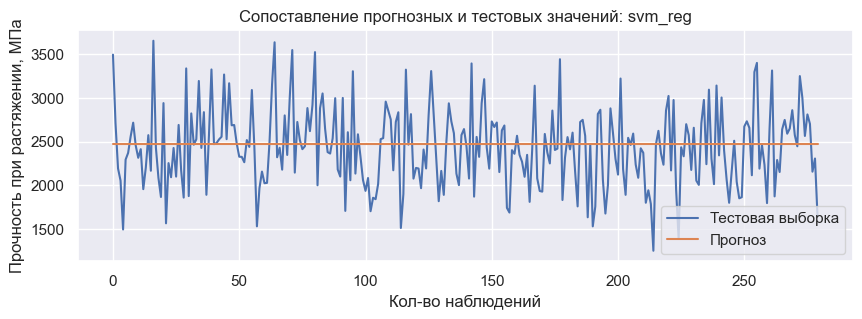

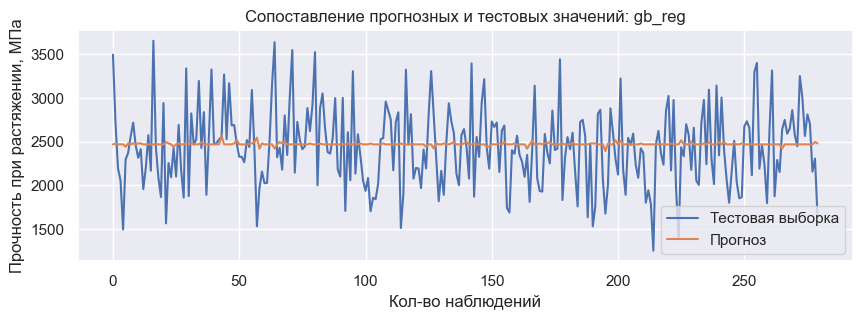

In [105]:
y_name = 'Прочность при растяжении, МПа'

for model_name, predict in y_pred_pr_norm.items():
    comparison_plot(y_test_pr.values, predict, y_name, model_name)

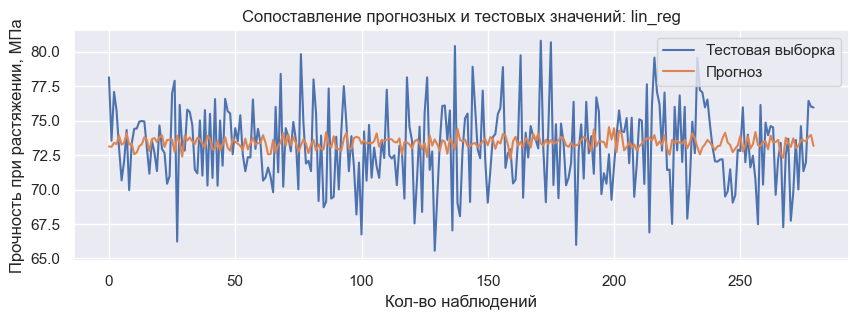

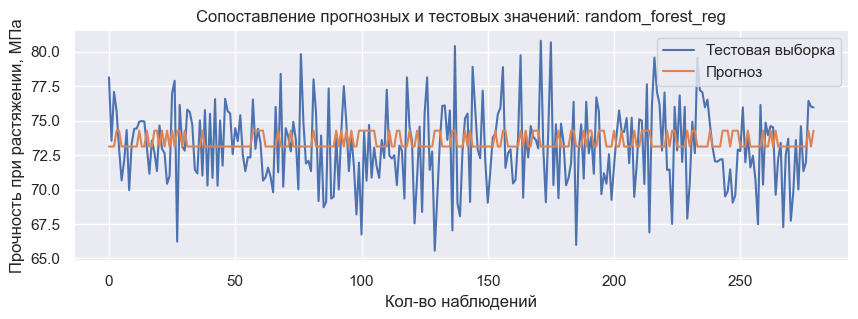

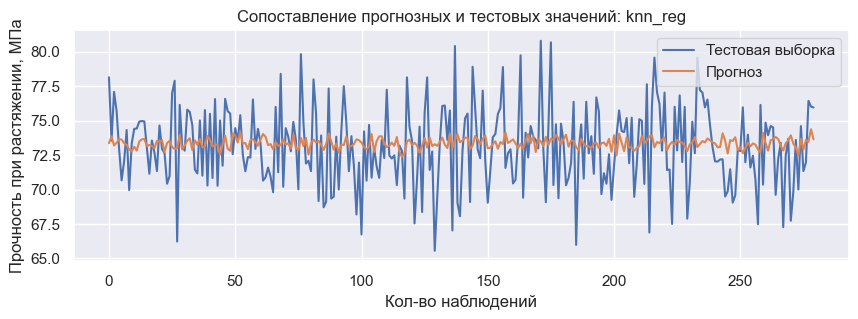

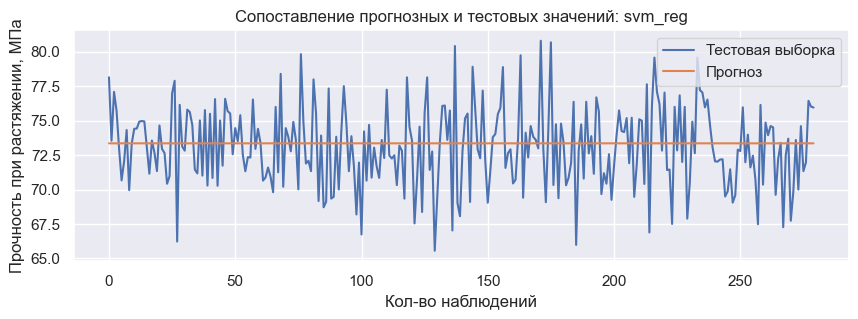

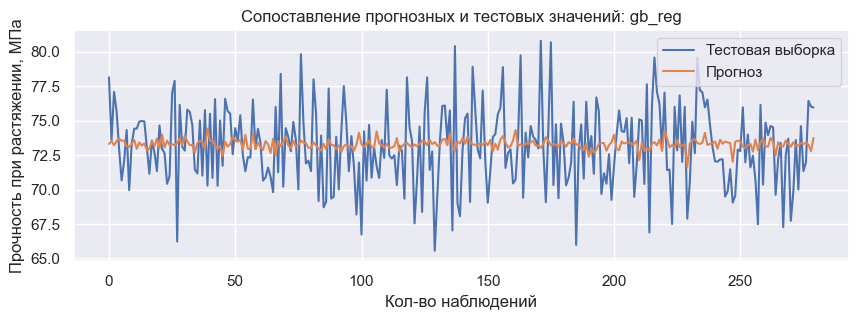

In [106]:
for model_name, predict in y_pred_upr_std.items():
    comparison_plot(y_test_upr.values, predict, y_name, model_name)

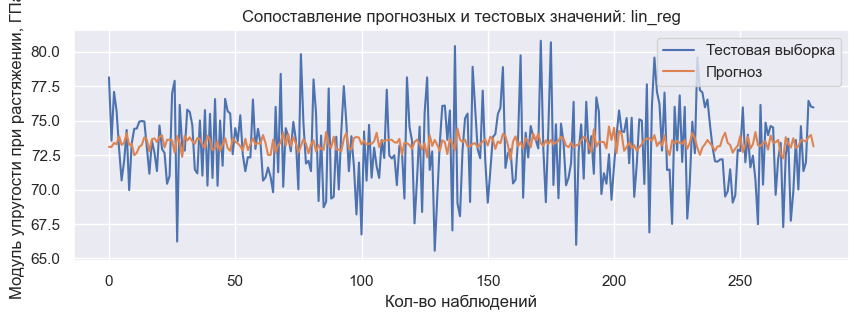

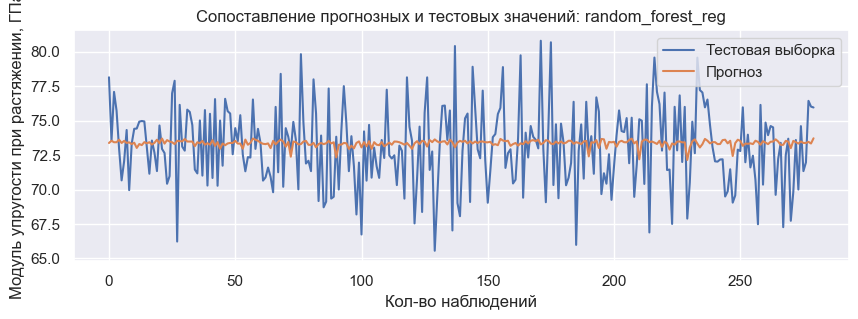

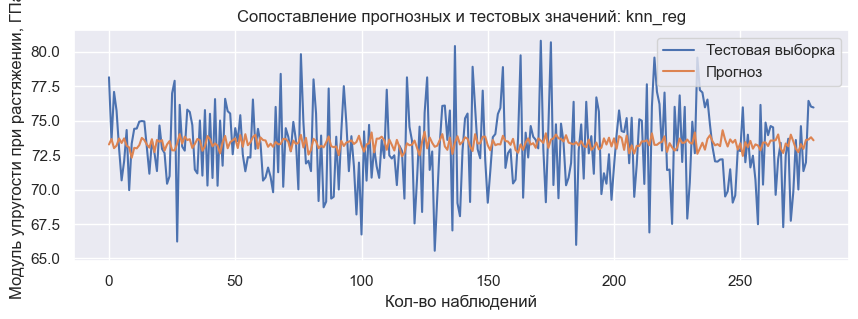

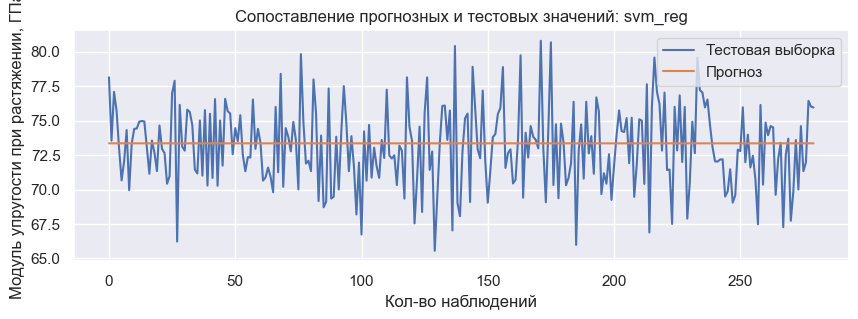

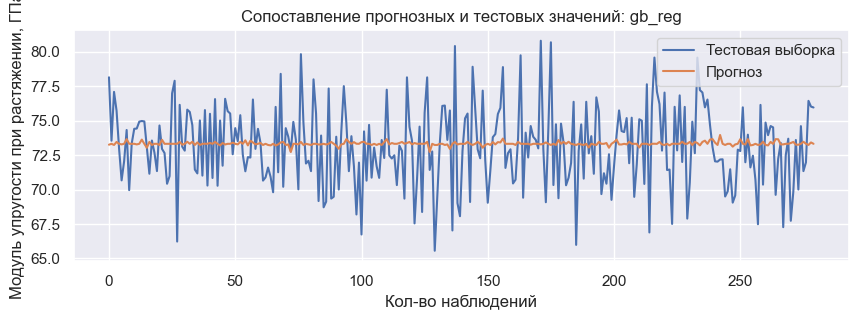

In [107]:
y_name = 'Модуль упругости при растяжении, ГПа'

for model_name, predict in y_pred_upr_norm.items():
    comparison_plot(y_test_upr.values, predict, y_name, model_name)

## НС для рекомендации соотношения матрица-наполнитель

In [108]:
y_matrix = df['Соотношение матрица-наполнитель'].copy()
X_matrix = df.drop('Соотношение матрица-наполнитель', axis=1)

X_train_matrix, X_test_matrix, y_train_matrix, y_test_matrix = train_test_split(X_matrix, y_matrix, test_size=0.3, random_state=1989)
X_train_matrix.shape, X_test_matrix.shape, y_train_matrix.shape, y_test_matrix.shape

((652, 12), (280, 12), (652,), (280,))

<Axes: >

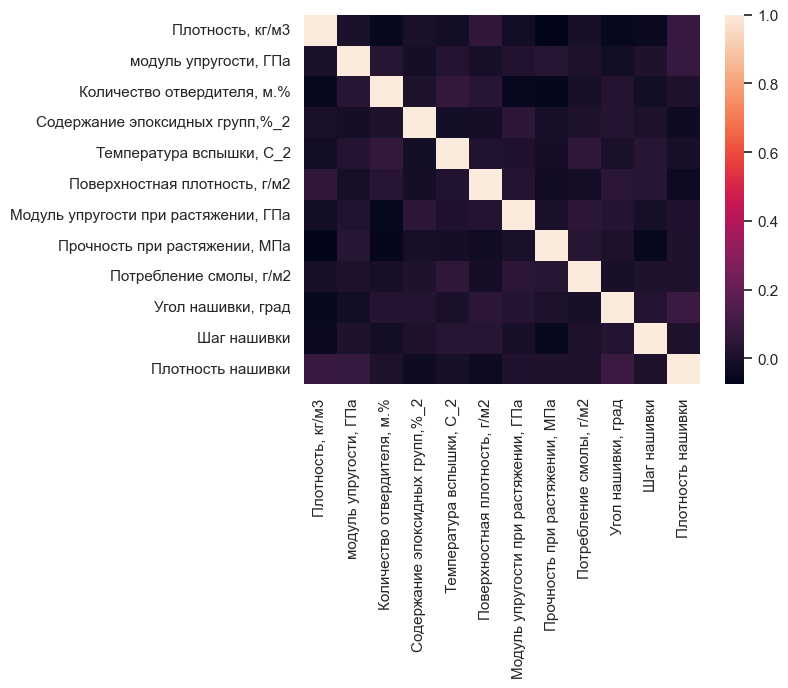

In [109]:
sns.heatmap(X_matrix.corr())

In [110]:
# X_train_matrix_norm, X_test_matrix_norm = scale(X_train_matrix, scaler='mm'), scale(X_test_matrix, scaler='mm')
# X_train_matrix_norm.head()

In [111]:
# X_train_matrix_std, X_test_matrix_std = scale(X_train_matrix, scaler='std'), scale(X_test_matrix, scaler='std')
# X_train_matrix_std.head()

In [112]:
# X_train_matrix_std.shape

In [113]:
import tensorflow as tf

from tensorflow import keras
# from tensorflow.keras import layers
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

In [114]:
normalizer = tf.keras.layers.Normalization(axis=-1) #создание слоя
normalizer.adapt(np.array(X_train_matrix)) #предобучение нормализатора. Аналог std

In [115]:
# normalizer.mean.numpy()

In [116]:
# first = np.array(X_train_matrix[:1])

# with np.printoptions(precision=2, suppress=True):
#   print('First example:', first)
#   print()
#   print('Normalized:', normalizer(first).numpy())

In [118]:
# linear_model = tf.keras.Sequential([
#     normalizer,
#     layers.Dense(units=1)
# ])

Когда мы вызываем `Model.predict` для пакета входных данных, он выдает выходные данные `units=1` для каждого примера:

In [ ]:
# linear_model.predict(X_train_matrix)

21/21 [==============================] - 0s 876us/step


array([[-1.5479783e+00],
       [ 2.4409657e+00],
       [-1.0613720e+00],
       [-7.5819033e-01],
       [-1.2457952e+00],
       [-2.9916804e+00],
       [ 5.6680286e-01],
       [-3.4130424e-01],
       [-8.2507038e-01],
       [-1.3798434e+00],
       [-1.5509396e+00],
       [ 6.1887228e-01],
       [ 1.5198338e-01],
       [-1.1680330e+00],
       [-2.8204207e+00],
       [-2.3616574e+00],
       [-3.0964267e-01],
       [-1.1500499e+00],
       [-1.4542426e+00],
       [ 2.2455890e+00],
       [ 1.5940648e+00],
       [ 3.4689298e+00],
       [ 3.0414546e-01],
       [ 1.7331612e+00],
       [ 1.4036524e-01],
       [ 1.4643151e-01],
       [-1.2143311e-01],
       [-1.2131021e+00],
       [-3.0457819e-01],
       [ 1.4691150e+00],
       [ 1.0009582e+00],
       [ 2.4219394e+00],
       [ 1.0697410e+00],
       [-1.5866562e+00],
       [-5.5441403e-01],
       [-1.8885323e+00],
       [ 1.4435304e+00],
       [-2.9386246e+00],
       [-3.2624516e+00],
       [ 6.2218928e-01],


Когда мы вызываем модель, это приводит к формированию матрицы весов этой модели, в частности матрица синаптических весов "ядра" ($ m$ в $y = mx +b $) имеет форму `(9, 1)`:


In [ ]:
# linear_model.layers[1].kernel

<tf.Variable 'dense/kernel:0' shape=(12, 1) dtype=float32, numpy=
array([[-0.04392397],
       [ 0.6715628 ],
       [ 0.4446944 ],
       [ 0.26929897],
       [-0.14317733],
       [-0.5515351 ],
       [ 0.30570704],
       [-0.35228953],
       [-0.61840636],
       [-0.32945788],
       [ 0.24391854],
       [-0.2661097 ]], dtype=float32)>

#### Сконфигурируем модель с помошью функции Keras `Model.compile` и обучим ее за 100 эпох с помощью `Model.fit`, используя среднеквадратическую функцию ошибки:

In [ ]:
# linear_model.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=0.1),
#     loss='mean_absolute_error')

In [ ]:
# %%time
# history = linear_model.fit(
#     X_train_matrix,
#     y_train_matrix,
#     epochs=100,
#     # Подавляем вывол протоколов обучения.
#     verbose=0,
#     # Используем 20% обучающих данных для валидации.
#     validation_split = 0.2)

CPU times: total: 6 s
Wall time: 5.61 s


In [119]:
def plot_loss(history):
  plt.plot(history.history['loss'], label='Ошибка обучения')
  plt.plot(history.history['val_loss'], label='Ошибка валидации')
  plt.ylim([0, 5])
  plt.xlabel('Эпохи обучения')
  plt.ylabel('Ошибка прогноза')
  plt.legend()
  plt.grid(True)

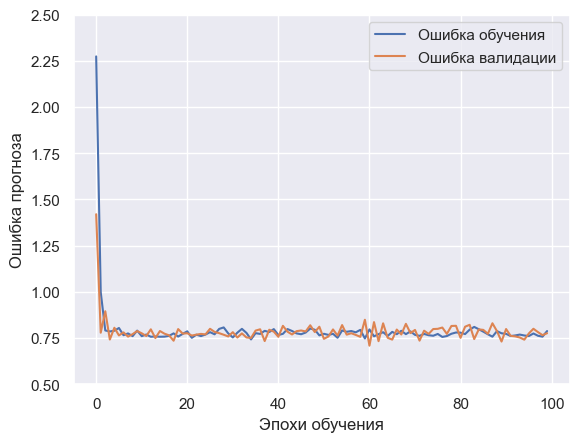

In [ ]:
# plot_loss(history)

In [ ]:
# test_results = {}
# test_results['linear_model'] = linear_model.evaluate(
#     X_test_matrix, y_test_matrix, verbose=0)

In [ ]:
# test_results

{'linear_model': 0.7355955243110657}

In [ ]:
# lin_y_pred = linear_model.predict(X_test_matrix)

9/9 [==============================] - 0s 2ms/step


In [ ]:
# model_metrics('linear_model', y_test_matrix, lin_y_pred)

,MSE,RMSE,MAE,R2
linear_model,0.796858,0.892669,0.735596,-0.045776


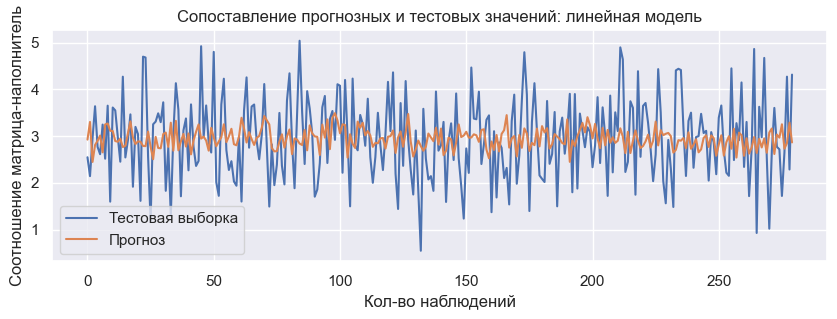

In [ ]:
# comparison_plot(y_test_matrix.values, lin_y_pred, y_name='Соотношение матрица-наполнитель', model_name='линейная модель')

In [120]:
from keras.callbacks import EarlyStopping

In [121]:
model = Sequential()

model.add(normalizer)
model.add(Dense(10, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(10, activation='relu'))
model.add(Dense(1))

model.compile(optimizer=Adam(learning_rate=0.001),
              loss='mean_absolute_error',
              metrics=[keras.metrics.RootMeanSquaredError()])

model.summary()

history = model.fit(X_train_matrix,
                    y_train_matrix,
                    epochs=50,
                    batch_size=20,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5)])



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense (Dense)               (None, 10)                130       
                                                                 
 dropout (Dropout)           (None, 10)                0         
                                                                 
 dense_1 (Dense)             (None, 10)                110       
                                                                 
 dense_2 (Dense)             (None, 1)                 11        
                                                                 
Total params: 276
Trainable params: 251
Non-trainable params: 25
_________________________________________________________

33/33 [==============================] - 3s 31ms/step - loss: 3.2756 - root_mean_squared_error: 3.4320 - val_loss: 3.0811 - val_root_mean_squared_error: 3.2196
Epoch 2/50
33/33 [==============================] - 0s 10ms/step - loss: 2.8848 - root_mean_squared_error: 3.0576 - val_loss: 2.6790 - val_root_mean_squared_error: 2.8367
Epoch 3/50
33/33 [==============================] - 0s 10ms/step - loss: 2.4631 - root_mean_squared_error: 2.6654 - val_loss: 2.2484 - val_root_mean_squared_error: 2.4440
Epoch 4/50
33/33 [==============================] - 0s 11ms/step - loss: 1.9735 - root_mean_squared_error: 2.2190 - val_loss: 1.7619 - val_root_mean_squared_error: 1.9996
Epoch 5/50
33/33 [==============================] - 0s 11ms/step - loss: 1.5776 - root_mean_squared_error: 1.8505 - val_loss: 1.3276 - val_root_mean_squared_error: 1.5735
Epoch 6/50
33/33 [==============================] - 0s 11ms/step - loss: 1.3023 - root_mean_squared_error: 1.5803 - val_loss: 1.0599 - val_root_mean_squared

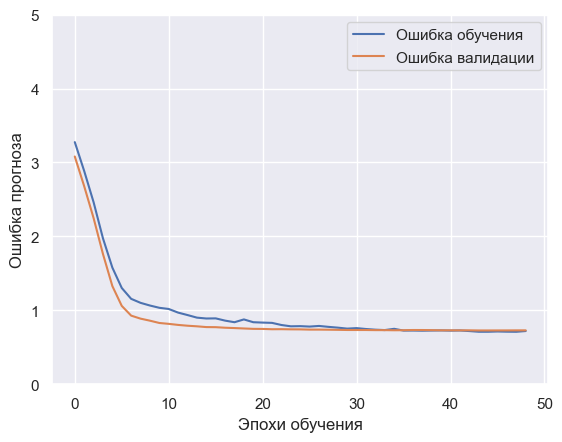

In [122]:
plot_loss(history)

In [123]:
def model_metrics(model_name:str(), y_test, y_pred):
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    metrics = pd.DataFrame({
            "MSE": [mse],
            "RMSE": [rmse],
            "MAE": [mae],
            "R2": [r2]}, index=[model_name])

    return metrics

In [124]:
results1 = model_metrics('НС_1', y_test_matrix, model.predict(X_test_matrix))
results1

9/9 [==============================] - 0s 4ms/step


,MSE,RMSE,MAE,R2
НС_1,0.781945,0.884277,0.729239,-0.026205


9/9 [==============================] - 0s 4ms/step


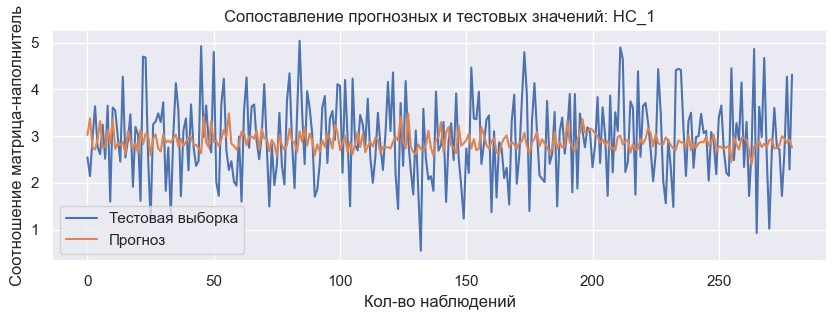

In [125]:
comparison_plot(y_test_matrix.values, model.predict(X_test_matrix), y_name='Соотношение матрица-наполнитель', model_name='НС_1')

In [126]:
model_2 = Sequential()

model_2.add(normalizer)
model_2.add(Dense(100, activation='relu',)) #input_shape=(len(indexes),)))
model_2.add(Dropout(0.2))
model_2.add(Dense(50, activation='relu'))
model_2.add(Dropout(0.2))
model_2.add(Dense(20, activation='relu'))
model_2.add(Dropout(0.2))
model_2.add(Dense(10, activation='relu'))
model_2.add(Dense(1))

model_2.compile(optimizer=Adam(learning_rate=0.0001),
              loss='mean_absolute_error',
              metrics=[keras.metrics.RootMeanSquaredError()])

model_2.summary()

history_2 = model_2.fit(X_train_matrix,
                    y_train_matrix,
                    epochs=50,
                    batch_size=20,
                    validation_split=0.2,
                    validation_data=(X_test_matrix, y_test_matrix),
                    callbacks=[EarlyStopping(monitor='val_loss', patience=5)])


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense_3 (Dense)             (None, 100)               1300      
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_4 (Dense)             (None, 50)                5050      
                                                                 
 dropout_2 (Dropout)         (None, 50)                0         
                                                                 
 dense_5 (Dense)             (None, 20)                1020      
                                                      

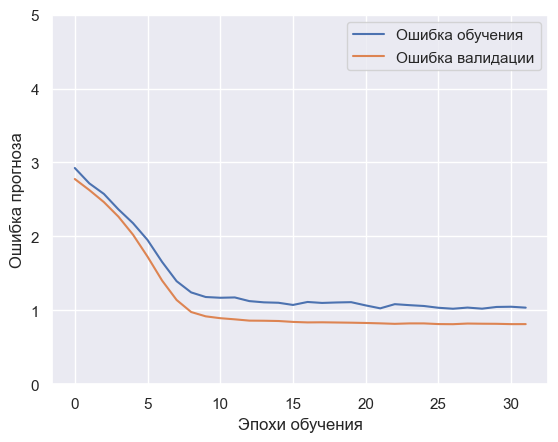

In [127]:
plot_loss(history_2)

In [128]:
results2 = model_metrics('НС_2', y_test_matrix, model_2.predict(X_test_matrix))
results2

9/9 [==============================] - 1s 4ms/step


,MSE,RMSE,MAE,R2
НС_2,0.985132,0.992538,0.813561,-0.292862


9/9 [==============================] - 0s 4ms/step


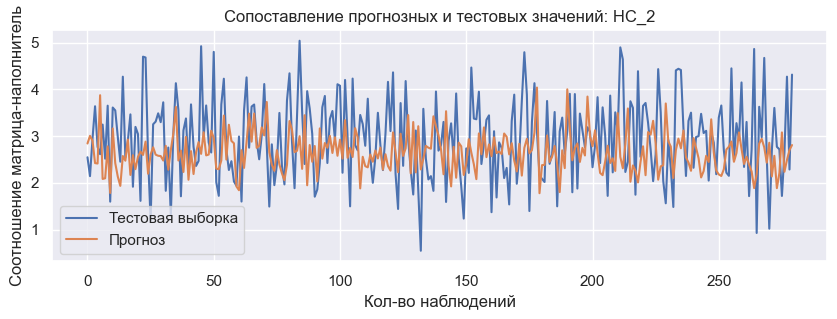

In [129]:
comparison_plot(y_test_matrix.values, model_2.predict(X_test_matrix), y_name='Соотношение матрица-наполнитель', model_name='НС_2')

In [130]:
results = pd.concat([results1, results2]) 
results

,MSE,RMSE,MAE,R2
НС_1,0.781945,0.884277,0.729239,-0.026205
НС_2,0.985132,0.992538,0.813561,-0.292862


In [131]:
model.save('my_model')

INFO:tensorflow:Assets written to: my_model\assets


In [132]:
model_path = 'C:/Users/mshipov/Desktop/МГТУ/VKR/app/VKR_Flask/models/model_HC_1'
model.save(model_path)
model.save_weights(model_path + 'weights')

INFO:tensorflow:Assets written to: C:/Users/mshipov/Desktop/МГТУ/VKR/app/VKR_Flask/models/model_HC_1\assets


In [133]:
model_restored = tf.keras.models.load_model(model_path)
model_restored.summary()
loss, rmse = model_restored.evaluate(X_test_matrix, y_test_matrix, verbose=2)
print('Restored model, RMSE: {:5.2f}%'.format(100 * rmse))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizatio  (None, 12)               25        
 n)                                                              
                                                                 
 dense (Dense)               (None, 10)                130       
                                                                 
 dropout (Dropout)           (None, 10)                0         
                                                                 
 dense_1 (Dense)             (None, 10)                110       
                                                                 
 dense_2 (Dense)             (None, 1)                 11        
                                                                 
Total params: 276
Trainable params: 251
Non-trainable params: 25
_________________________________________________________

## Разработка приложения